In [2]:
library(ggvenn)
library(dplyr)
library(STRINGdb)

In [3]:
DEGsLIMMA <- readRDS('../data/DEGsLIMMA.Rds')
DEGsWGCNA <- readRDS('../data/DEGsWGCNA.Rds')

DMGsLIMMA <- readRDS('../data/DMGsLIMMA.Rds')
DMGsWGCNA <- readRDS('../data/DMGsWGCNA.Rds')

In [4]:
DMGsLIMMA <- read.csv("../data/GSE109887.top.table.tsv", sep = "\t")
head(DMGsLIMMA)

,ID,adj.P.Val,P.Value,t,B,logFC,ORF,SPOT_ID
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<lgl>
1,HSPB3,9.64e-08,3.04e-12,-8.263895,17.51884,-0.777,HSPB3,NA
2,DNAJC5G,1.66e-07,1.05e-11,-7.985662,16.33612,-0.246,DNAJC5G,NA
3,FRMPD2,3.03e-07,2.99e-11,-7.749829,15.33546,-0.209,FRMPD2,NA
4,CENTD2,3.03e-07,4.01e-11,7.683588,15.05485,0.192,CENTD2,NA
5,VGF,3.03e-07,4.78e-11,-7.643796,14.88639,-1.600,VGF,NA
6,ATXN10,3.32e-07,6.28e-11,-7.582110,14.62543,-0.304,ATXN10,NA


# PPI of STRING DB

In [5]:
degs <- DEGsLIMMA %>% filter(P.Value < .01 & abs(logFC) > 1.25) 
dmgs <- DMGsLIMMA %>% filter(P.Value < .05 & abs(t) > 2) 

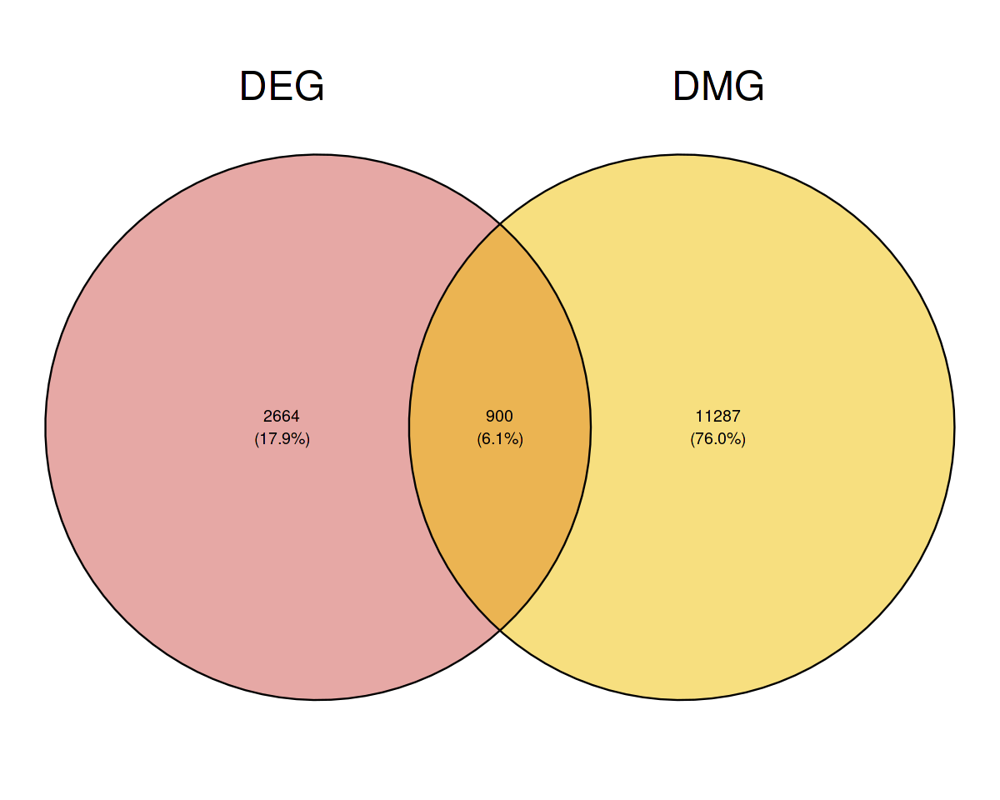

In [6]:
x <- list(
  DEG = degs$ID, 
  DMG = dmgs$ID
)
options(repr.plot.width=10, repr.plot.height=8)
ggvenn(
    x, 
    fill_color = c("#CD534CFF", "#EFC000FF", "#868686FF"),
    stroke_size = 0.5, set_name_size = 10
)

In [21]:
string_db <- STRINGdb$new(
    version="11.5", species=9606, score_threshold=300,
    input_directory="")

# DEG & DMG

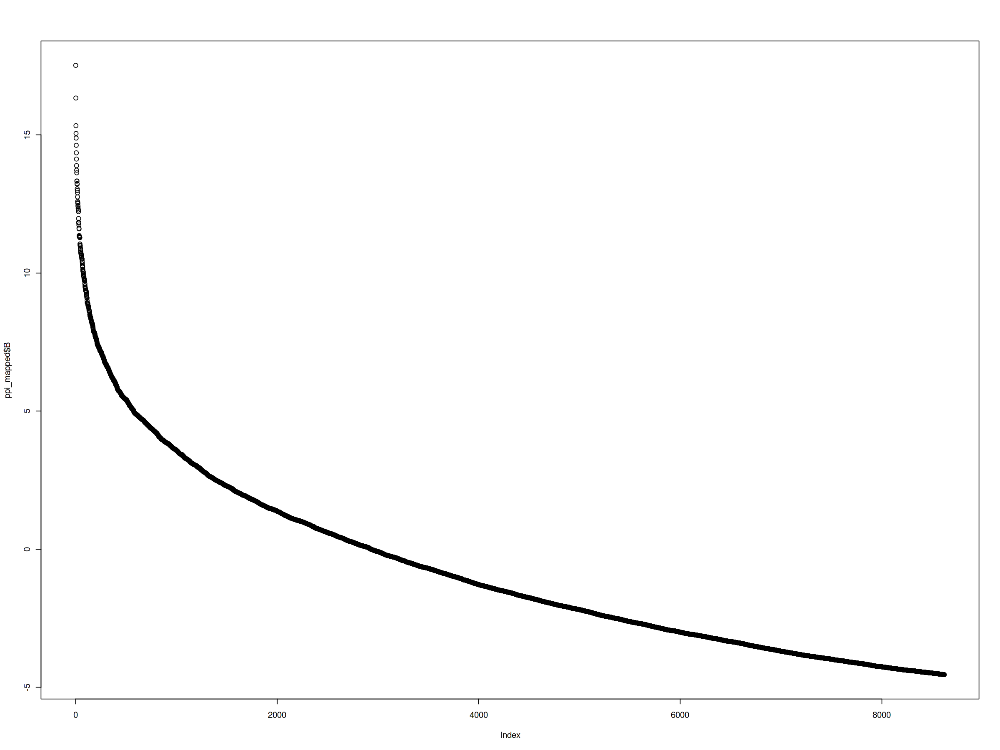

In [67]:
roi <- dmgs$ID
ppi_mapped <- string_db$map( dmgs[roi, ], "ID", removeUnmappedRows = TRUE )

plot(ppi_mapped$B)

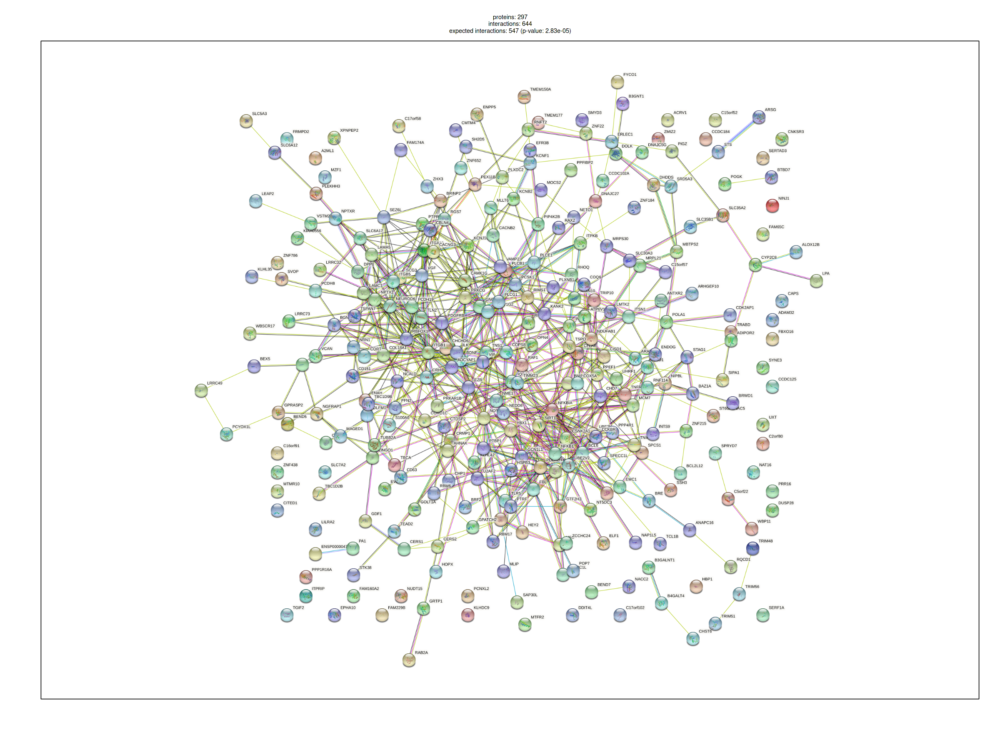

In [68]:
hits <- ppi_mapped$STRING_id[1:300]
options(repr.plot.width=20, repr.plot.height=15)
string_db$plot_network( hits )

In [69]:
write.table(
    select(ppi_mapped, STRING_id), '../data/DMG.csv', 
    row.names=F, sep=",")

# MeDEG

In [24]:
row.names(degs) <- degs$ID
row.names(dmgs) <- dmgs$ID

roi <- degs$ID %in% dmgs$ID
roi <- row.names(degs[roi,])

In [25]:
uMEdDEG <- degs[roi, ][(degs[roi, ]$logFC < 0) & (dmgs[roi, ]$logFC > 0),]
dMEuDEG <- degs[roi, ][(degs[roi, ]$logFC > 0) & (dmgs[roi, ]$logFC < 0),]
MeDEG <- rbind(uMEdDEG, dMEuDEG)

MeDEG$regulation <- MeDEG$logFC - dmgs[row.names(MeDEG), ]$logFC
head(MeDEG)

,id,ID,logFC,AveExpr,t,P.Value,adj.P.Val,B,regulation
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
PWRN2,PWRN2,PWRN2,-4.988428,7.760533,-9.965958,2.862849e-10,1.772103e-07,13.56364,-5.021728
CTGF,CTGF,CTGF,-3.049630,3.631223,-9.108415,1.741468e-09,6.346168e-07,11.83124,-3.459630
ANKRD33,ANKRD33,ANKRD33,-4.258837,10.673341,-9.085945,1.828175e-09,6.466518e-07,11.78443,-4.475837
OR2A25,OR2A25,OR2A25,-4.928180,6.376706,-9.007670,2.166458e-09,7.314751e-07,11.62084,-4.979580
ARHGEF15,ARHGEF15,ARHGEF15,-3.434868,9.351209,-8.260178,1.141747e-08,2.355805e-06,10.01419,-3.486368
CLCNKA,CLCNKA,CLCNKA,-4.375518,7.302383,-7.988376,2.128214e-08,3.328078e-06,9.41011,-4.598518


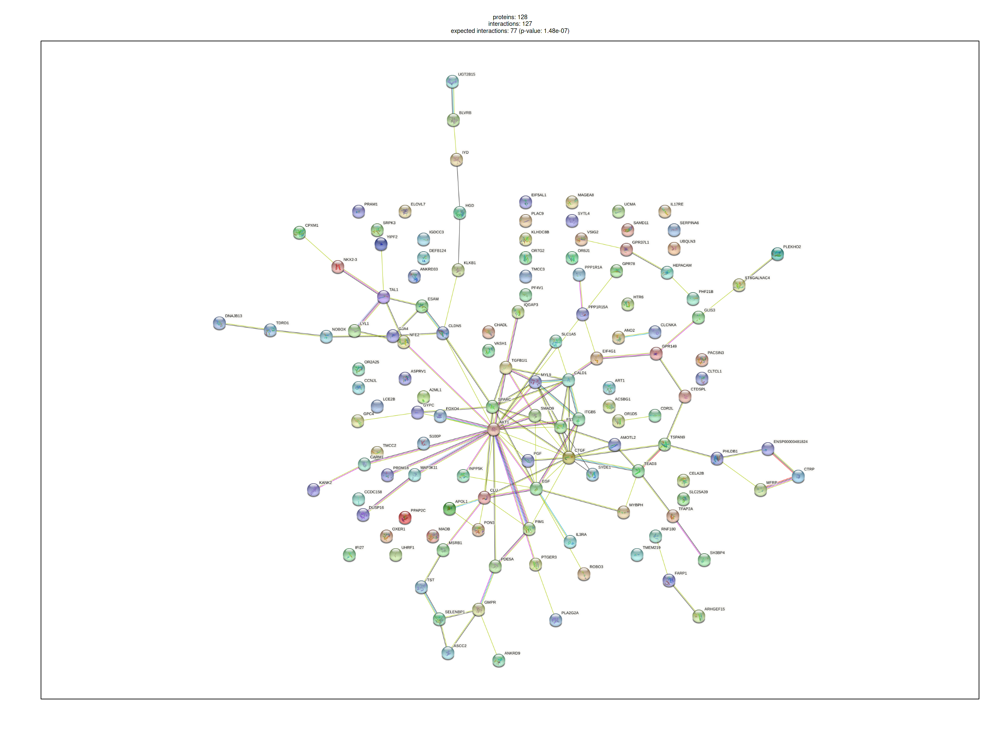

In [26]:
ppi_mapped <- string_db$map( uMEdDEG, "ID", removeUnmappedRows = TRUE )
hits <- ppi_mapped$STRING_id

options(repr.plot.width=20, repr.plot.height=15)
string_db$plot_network( hits )

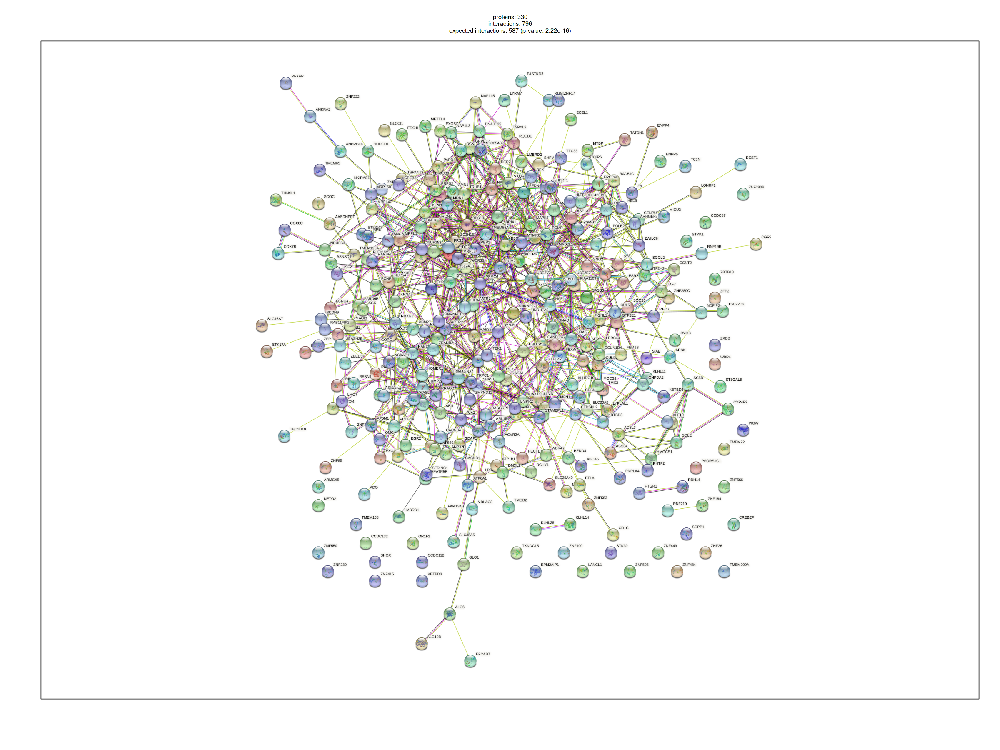

In [27]:
ppi_mapped <- string_db$map( dMEuDEG, "ID", removeUnmappedRows = TRUE )

hits <- ppi_mapped$STRING_id
options(repr.plot.width=20, repr.plot.height=15)
string_db$plot_network( hits )

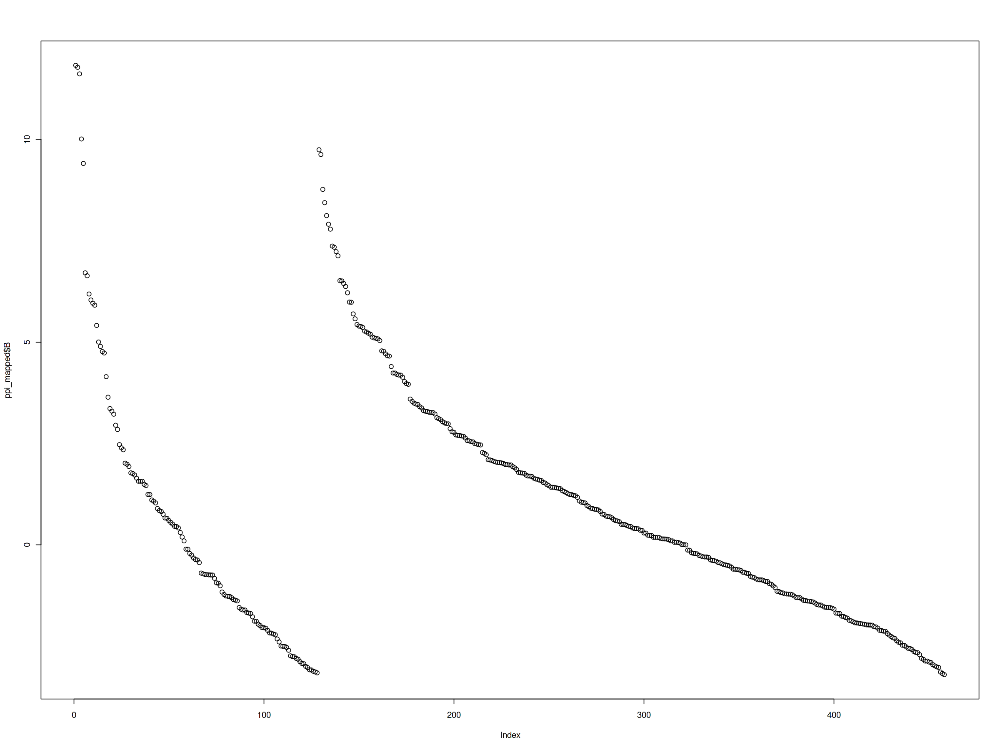

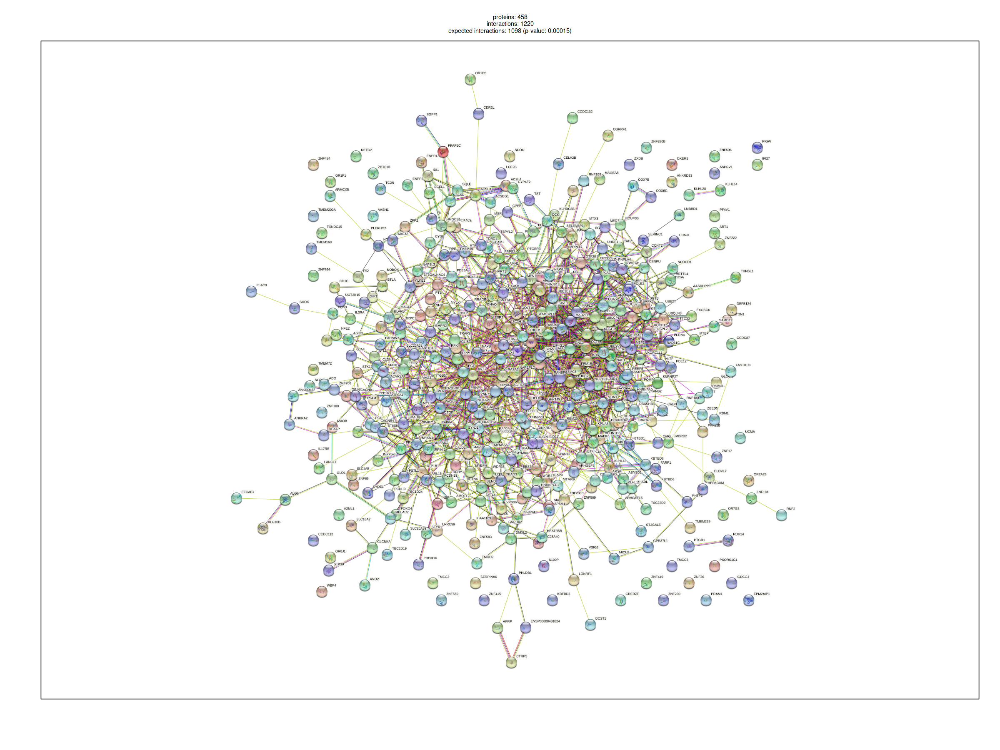

In [28]:
ppi_mapped <- string_db$map( MeDEG, "ID", removeUnmappedRows = TRUE )
plot(ppi_mapped$B)

hits <- ppi_mapped$STRING_id
options(repr.plot.width=20, repr.plot.height=15)
string_db$plot_network( hits )

In [40]:
write.table(
    select(ppi_mapped, STRING_id), '../data/MeDEG.csv', 
    row.names=F, sep=",")

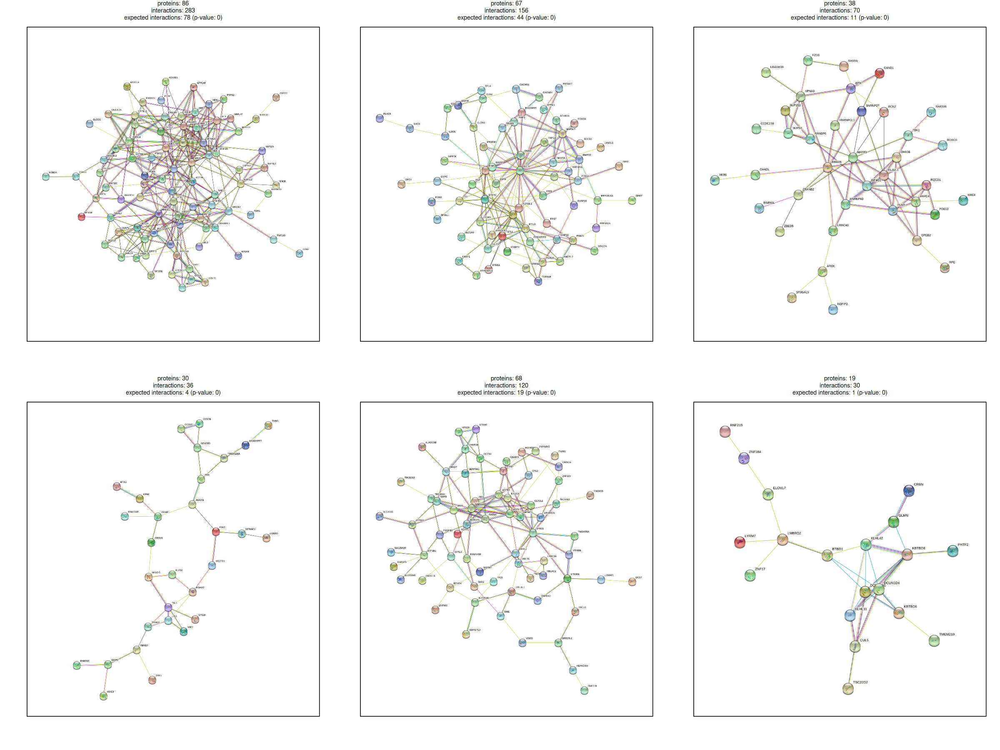

In [32]:
clustersList <- string_db$get_clusters(ppi_mapped$STRING_id)
# plot first 4 clusters
par(mfrow=c(2,3))
enrichment <- c()
for(i in seq(1:6)){
    string_db$plot_network(clustersList[[i]])
    enrichment <- c(
        enrichment, string_db$get_enrichment( clustersList[[i]] ))
    
}

# Post Analysis

In [71]:
ppi_mapped <- string_db$map( MeDEG, "ID", removeUnmappedRows = TRUE )

In [72]:
dmgs[dmgs$ID %in% c(
    "MAPT", "DDPAC", "FTDP-17", "MAPTL", "MSTD",    
    "MTBT1", "MTBT2", "PPND", "APP", "TAU"),]

,ID,adj.P.Val,P.Value,t,B,logFC,ORF,SPOT_ID
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<lgl>
MAPT,MAPT,0.000802,5.38e-05,-4.275585,1.626912,-0.282,MAPT,NA
APP,APP,0.013700,2.54e-03,-3.119781,-1.939380,-0.468,APP,NA


### Lookup Hubs from MeDEG:

In [73]:
hubs <- c(
    "9606.ENSP00000451828",
    "9606.ENSP00000401802",
    "9606.ENSP00000265171",
    "9606.ENSP00000260443",
    "9606.ENSP00000338862",
    "9606.ENSP00000296509",
    "9606.ENSP00000376946",
    "9606.ENSP00000261890",
    "9606.ENSP00000395772",
    "9606.ENSP00000428209"
)
ppi_mapped[ppi_mapped$STRING_id %in% hubs, ]

,ID,id,logFC,AveExpr,t,P.Value,adj.P.Val,B,regulation,STRING_id
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
89,AKT1,AKT1,-1.406867,11.129490,-3.487079,1.791663e-03,9.322924e-03,-1.60948011,-1.671867,9606.ENSP00000451828
114,EGF,EGF,-1.384222,4.608930,-3.000466,5.962777e-03,2.331746e-02,-2.74342605,-1.461122,9606.ENSP00000265171
162,RSL24D1,RSL24D1,2.922756,7.831847,6.037063,2.446982e-06,7.972008e-05,4.78416596,3.212756,9606.ENSP00000260443
218,BBS10,BBS10,2.465333,6.597872,4.971036,3.838799e-05,5.344817e-04,2.09793583,2.633333,9606.ENSP00000376946
287,UBE2V2,UBE2V2,1.623192,6.061654,4.367378,1.858455e-04,1.673285e-03,0.56666520,2.028192,9606.ENSP00000428209
317,MAD2L1,MAD2L1,1.714287,6.674152,4.165768,3.141453e-04,2.481097e-03,0.05938875,1.892287,9606.ENSP00000296509
331,RAB11A,RAB11A,1.630989,7.138238,4.023005,4.548971e-04,3.294954e-03,-0.29741055,1.908989,9606.ENSP00000261890
394,PSMC6,PSMC6,1.682240,9.311100,3.526974,1.620069e-03,8.617168e-03,-1.51370893,1.918240,9606.ENSP00000401802
421,BRIX1,BRIX1,1.303247,8.565950,3.312764,2.772299e-03,1.300451e-02,-2.02341218,1.446247,9606.ENSP00000338862


### Map Hubs from Me to DEG:

In [91]:
ppi_mapped <- string_db$map( degs, "ID", removeUnmappedRows = TRUE )
hubs <- c(
    "9606.ENSP00000269571",
    "9606.ENSP00000258962",
    "9606.ENSP00000215832",
    "9606.ENSP00000349960",
    "9606.ENSP00000251453",
    "9606.ENSP00000400175",
    "9606.ENSP00000225174",
    "9606.ENSP00000256078",
    "9606.ENSP00000263431",
    "9606.ENSP00000284981"
)
ppi_mapped[ppi_mapped$STRING_id %in% hubs, ]

,ID,id,logFC,AveExpr,t,P.Value,adj.P.Val,B,STRING_id
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
100,SRSF1,SRSF1,2.477624,6.222981,6.982449,2.31923e-07,1.632914e-05,7.085031,9606.ENSP00000258962


In [92]:
enrichment <- string_db$get_enrichment( hubs )
head(enrichment[enrichment$category == "Process",], 20)

,category,term,number_of_genes,number_of_genes_in_background,ncbiTaxonId,inputGenes,preferredNames,p_value,fdr,description
,<chr>,<chr>,<int>,<int>,<int>,<chr>,<chr>,<dbl>,<dbl>,<chr>
2,Process,GO:0010001,5,178,9606,"9606.ENSP00000215832,9606.ENSP00000256078,9606.ENSP00000269571,9606.ENSP00000284981,9606.ENSP00000400175","MAPK1,KRAS,ERBB2,APP,RHOA",1.64e-08,0.00021,Glial cell differentiation
3,Process,GO:0071900,6,521,9606,"9606.ENSP00000215832,9606.ENSP00000256078,9606.ENSP00000269571,9606.ENSP00000284981,9606.ENSP00000349960,9606.ENSP00000400175","MAPK1,KRAS,ERBB2,APP,ACTB,RHOA",7.09e-08,0.00035,Regulation of protein serine/threonine kinase activity
4,Process,GO:0071902,5,348,9606,"9606.ENSP00000215832,9606.ENSP00000256078,9606.ENSP00000269571,9606.ENSP00000284981,9606.ENSP00000400175","MAPK1,KRAS,ERBB2,APP,RHOA",4.34e-07,0.00140,Positive regulation of protein serine/threonine kinase activity
5,Process,GO:0034250,4,162,9606,"9606.ENSP00000215832,9606.ENSP00000269571,9606.ENSP00000284981,9606.ENSP00000400175","MAPK1,ERBB2,APP,RHOA",1.01e-06,0.00240,Positive regulation of cellular amide metabolic process
6,Process,GO:0042060,5,439,9606,"9606.ENSP00000215832,9606.ENSP00000263431,9606.ENSP00000269571,9606.ENSP00000349960,9606.ENSP00000400175","MAPK1,PRKCG,ERBB2,ACTB,RHOA",1.35e-06,0.00240,Wound healing
7,Process,GO:0048584,8,2257,9606,"9606.ENSP00000215832,9606.ENSP00000225174,9606.ENSP00000256078,9606.ENSP00000263431,9606.ENSP00000269571,9606.ENSP00000284981,9606.ENSP00000349960,9606.ENSP00000400175","MAPK1,PPIF,KRAS,PRKCG,ERBB2,APP,ACTB,RHOA",1.15e-06,0.00240,Positive regulation of response to stimulus
8,Process,GO:0014070,6,911,9606,"9606.ENSP00000215832,9606.ENSP00000256078,9606.ENSP00000263431,9606.ENSP00000284981,9606.ENSP00000349960,9606.ENSP00000400175","MAPK1,KRAS,PRKCG,APP,ACTB,RHOA",1.86e-06,0.00270,Response to organic cyclic compound
9,Process,GO:0000904,5,566,9606,"9606.ENSP00000215832,9606.ENSP00000269571,9606.ENSP00000284981,9606.ENSP00000349960,9606.ENSP00000400175","MAPK1,ERBB2,APP,ACTB,RHOA",4.63e-06,0.00280,Cell morphogenesis involved in differentiation
10,Process,GO:0007417,6,988,9606,"9606.ENSP00000215832,9606.ENSP00000256078,9606.ENSP00000269571,9606.ENSP00000284981,9606.ENSP00000349960,9606.ENSP00000400175","MAPK1,KRAS,ERBB2,APP,ACTB,RHOA",2.97e-06,0.00280,Central nervous system development


In [94]:
library(ggplot2)
library(ggrepel)

In [102]:
enrichment$enrichment <- enrichment$number_of_genes
enrichment$P.Value <- enrichment$p_value

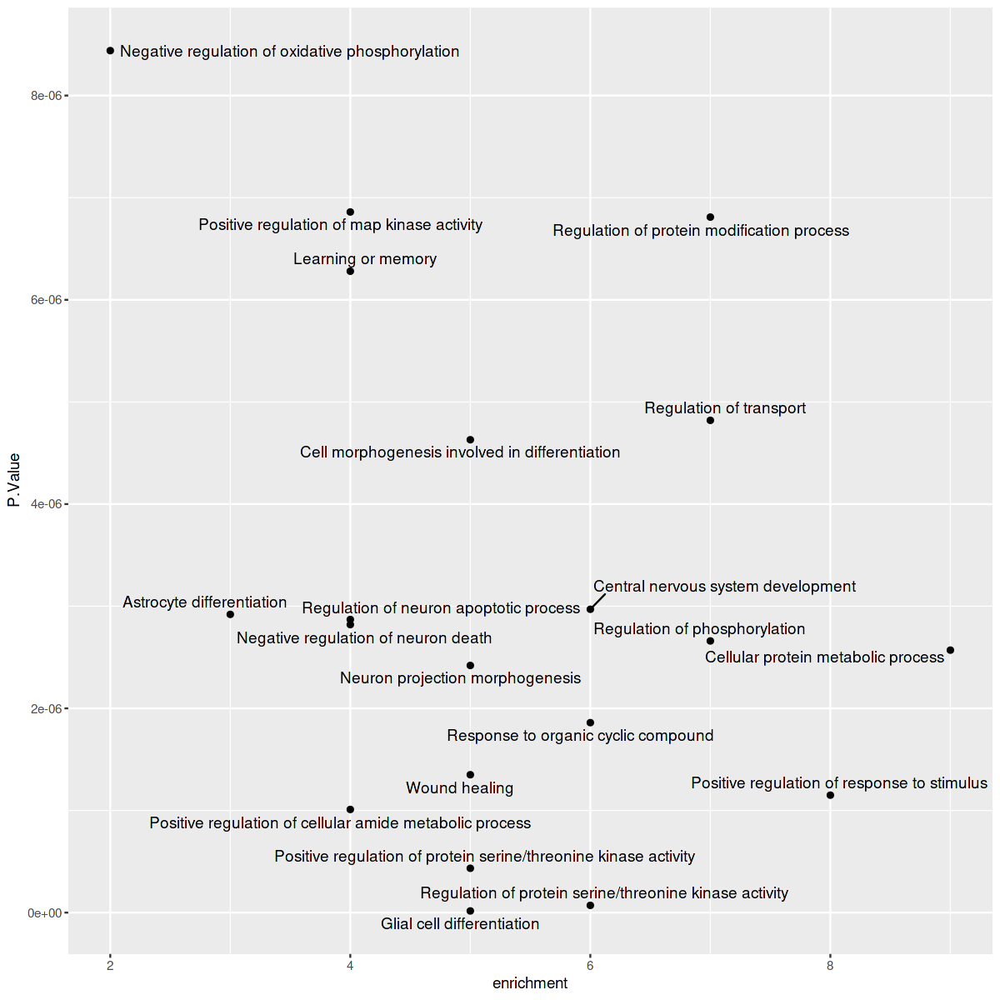

In [104]:
options(repr.plot.width=10, repr.plot.height=10)
enrichment[enrichment$category == "Process",][1:20,] %>% ggplot(
    aes(
        x=enrichment, y=P.Value, 
        label=paste("", description))
) + geom_point() + geom_text_repel()